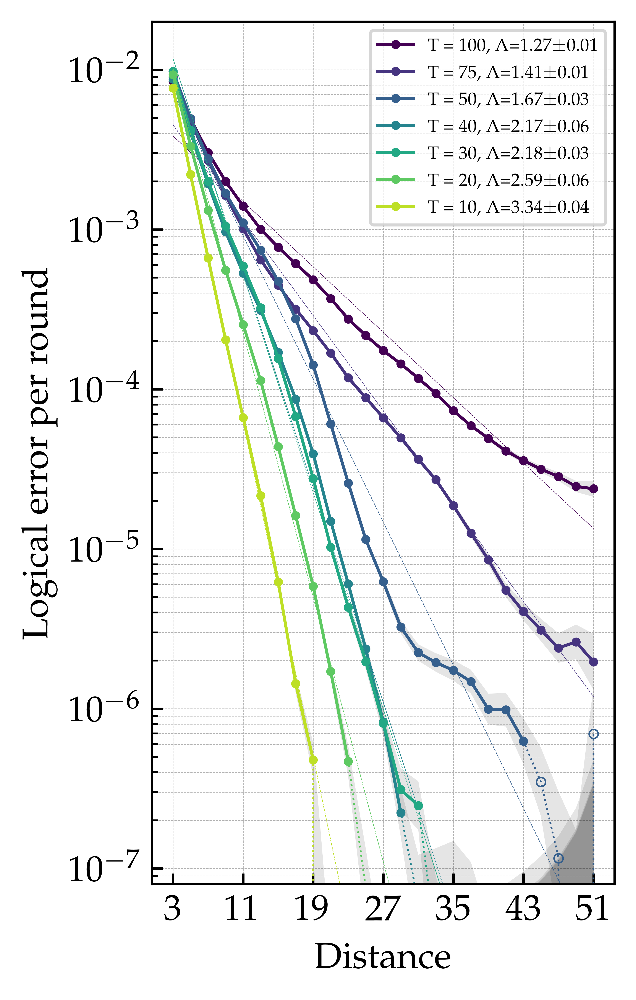

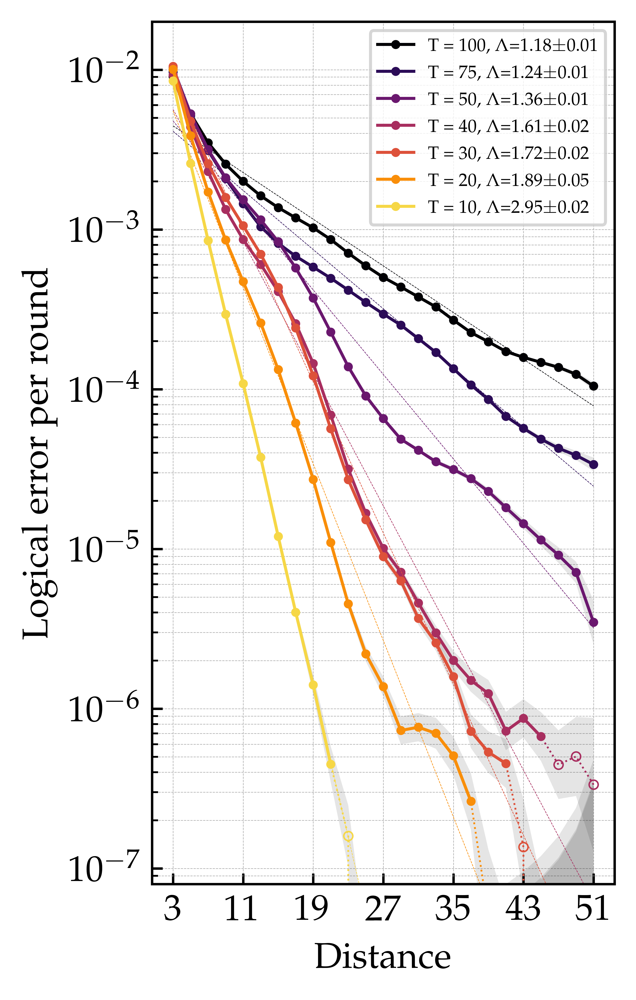

In [2]:
%reload_ext autoreload
%autoreload 2

from soft_info import get_err_dicts, plot_error_rates, save_plot
import numpy as np
from matplotlib import colormaps

DEVICE = 'ibm_sherbrooke'
STATE = 'X0'
PLOT = True


rounds = [10, 20, 30, 40, 50, 75, 100][::-1]
cmaps = [colormaps['viridis'], colormaps['inferno']]


for idx, method in enumerate(['s_KPS', 'h_KPS']):
    cmap = cmaps[idx]
    colors = [cmap(i) for i in np.linspace(0, 0.9, len(rounds))]
    distances = []
    errors = []
    shots = []
    labels = []
    for ROUNDS in rounds:
        file_name = f'../results/{DEVICE}_{STATE}_{ROUNDS}.json'
        err_per_job, err_per_method = get_err_dicts(file_name)


        labels.append(f"T = {ROUNDS}")
        data = err_per_method[method]
        distances.append(np.array(data['d']))
        errors.append(np.array(data['errs']))
        shots.append(np.array(data['tot_shots']))
        
    plot = plot_error_rates(distances, errors, shots, labels=labels, plot_e_L=True, 
                            T=ROUNDS, outlier_nb=5, state=STATE, ylim=(8e-8), plot=PLOT,
                            colors_TBU = colors, T_s=rounds, small_legend=True)

    save_plot(plot, f"4_RepetitionCodes/{method}_eL_per_round.pdf", format='pdf')


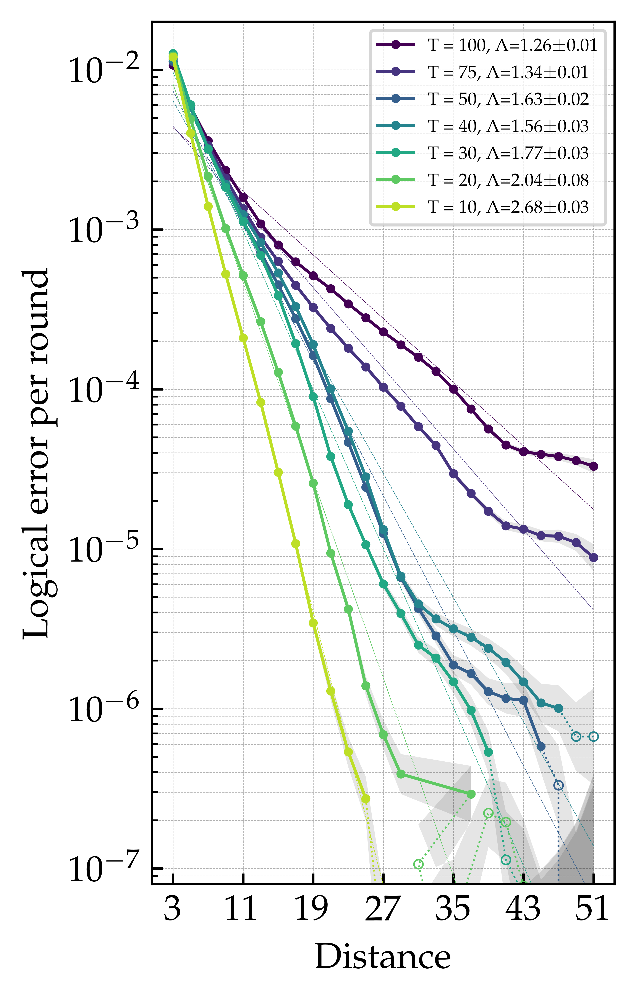

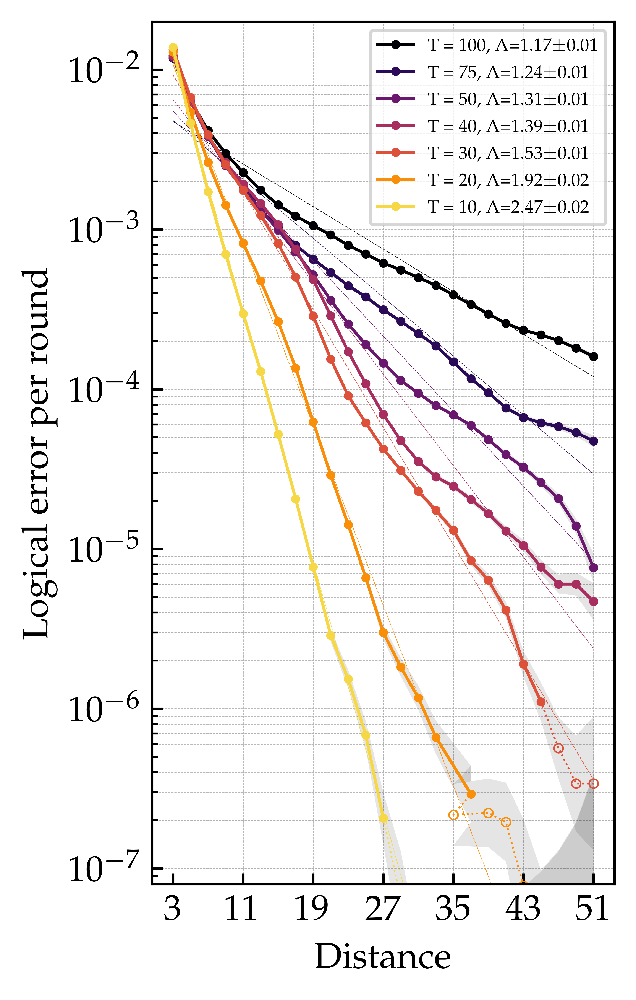

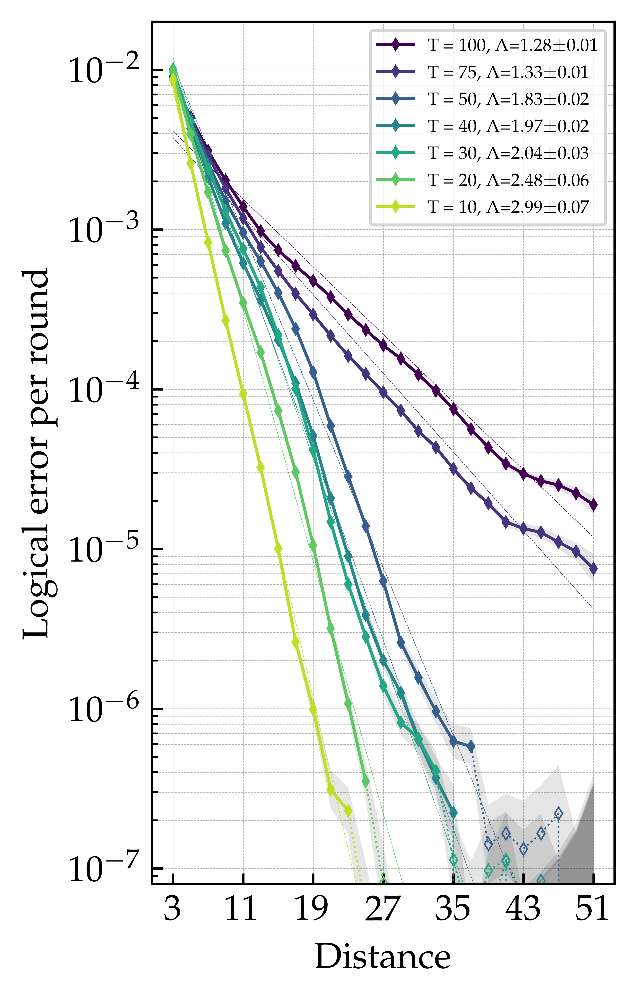

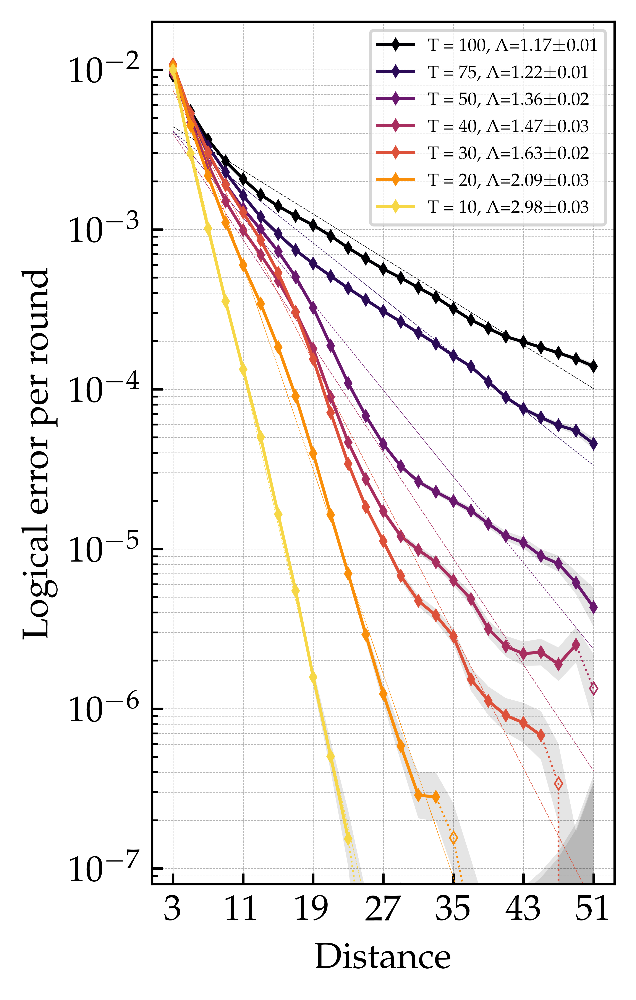

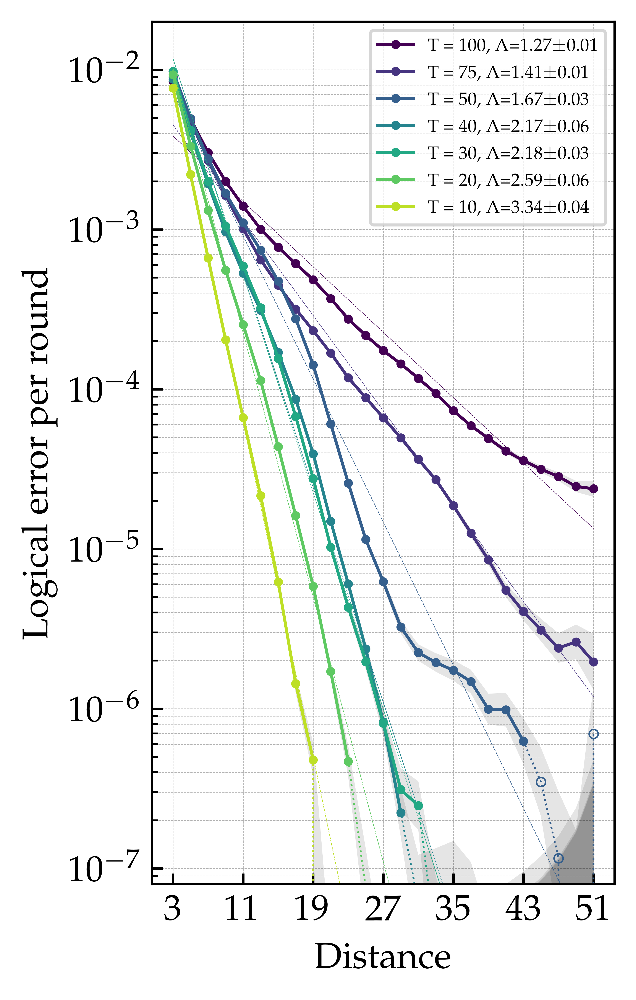

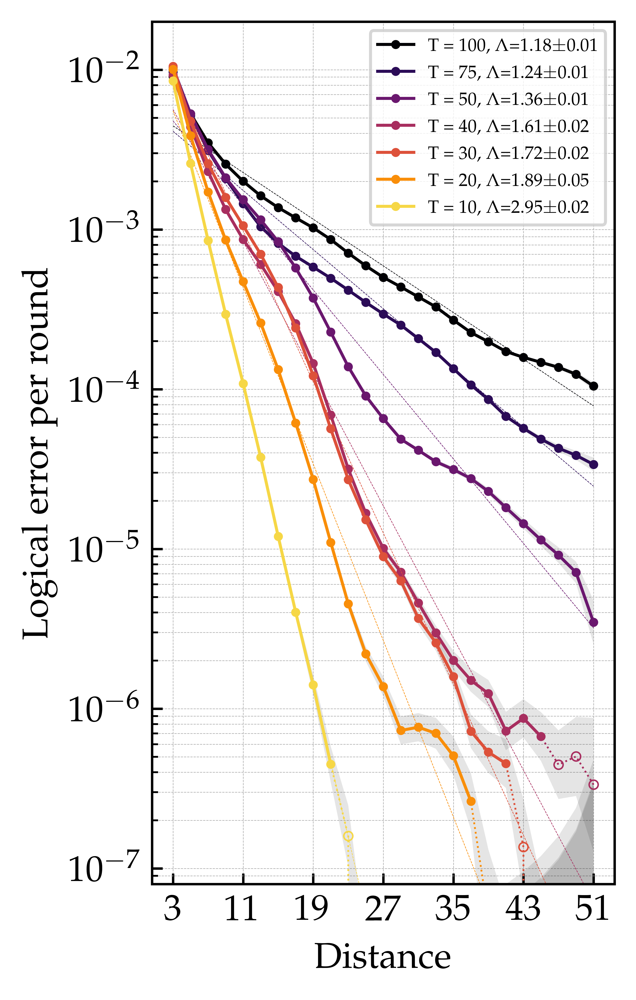

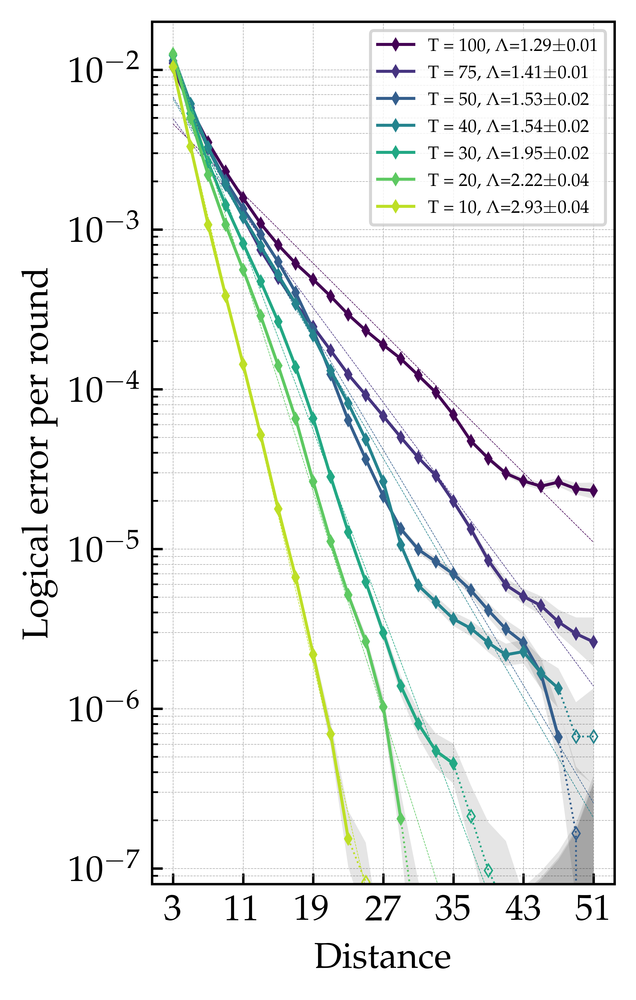

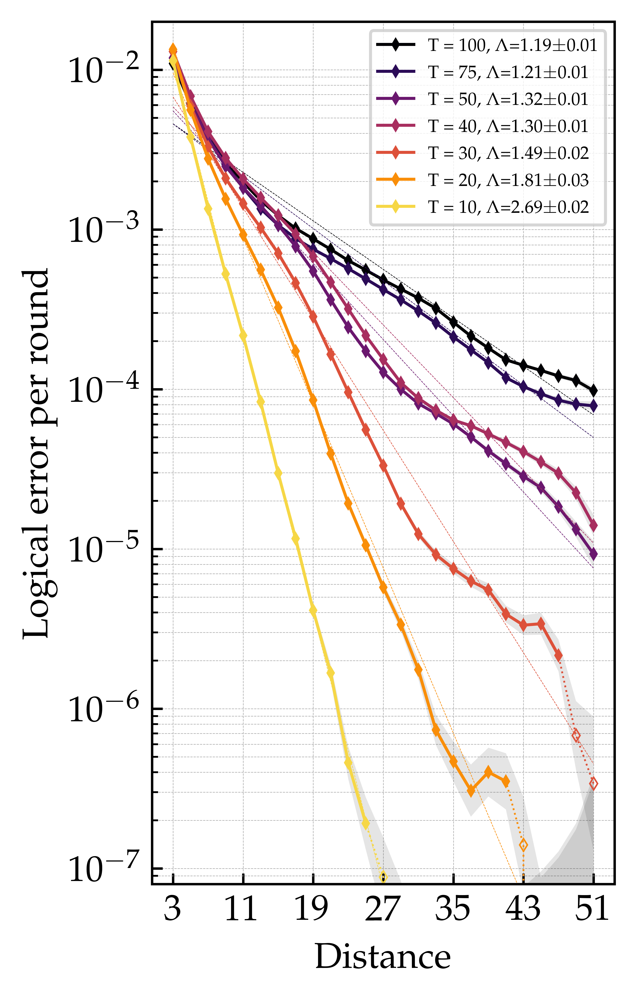

In [1]:
%reload_ext autoreload
%autoreload 2

from soft_info import get_err_dicts, plot_error_rates, save_plot
import numpy as np
from matplotlib import colormaps

DEVICE = 'ibm_sherbrooke'
STATE = 'Z1'
PLOT = True


rounds = [10, 20, 30, 40, 50, 75, 100][::-1]
cmaps = [colormaps['viridis'], colormaps['inferno']]

for STATE in ['Z0', 'Z1', 'X0', 'X1']:
    for idx, method in enumerate(['s_KPS', 'h_KPS']):
        cmap = cmaps[idx]
        colors = [cmap(i) for i in np.linspace(0, 0.9, len(rounds))]
        distances = []
        errors = []
        shots = []
        labels = []
        for ROUNDS in rounds:
            file_name = f'../results/{DEVICE}_{STATE}_{ROUNDS}.json'
            err_per_job, err_per_method = get_err_dicts(file_name)


            labels.append(f"T = {ROUNDS}")
            data = err_per_method[method]
            distances.append(np.array(data['d']))
            errors.append(np.array(data['errs']))
            shots.append(np.array(data['tot_shots']))
            
        plot = plot_error_rates(distances, errors, shots, labels=labels, plot_e_L=True, 
                                T=ROUNDS, outlier_nb=5, state=STATE, ylim=(8e-8), plot=PLOT,
                                colors_TBU = colors, T_s=rounds, small_legend=True)

        save_plot(plot, f"4_RepetitionCodes/{method}_{STATE}_eL_per_round.pdf", format='pdf')
